<a href="https://colab.research.google.com/github/embeddedai13/YOLOv5CustomDataSet/blob/main/Yolov5CustomDataSet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 10432, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 10432 (delta 0), reused 3 (delta 0), pack-reused 10429
Receiving objects: 100% (10432/10432), 10.58 MiB | 24.19 MiB/s, done.
Resolving deltas: 100% (7212/7212), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.2 MB/s 
     |████████████████████████████████| 145 kB 6.8 MB/s 
     |████████████████████████████████| 178 kB 32.5 MB/s 
     |████████████████████████████████| 1.1 MB 26.2 MB/s 
     |████████████████████████████████| 67 kB 5.2 MB/s 
     |████████████████████████████████| 138 kB 34.6 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.

In [1]:
%pip install requests==2.23.0
%pip install folium==0.2.1
%pip install imgaug==0.2.5

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [7]:
import os

In [8]:
# set up environment
os.environ["/content/datasets"] = "/content/datasets"

In [12]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="KoKdgBRJgw7s6vrqDtna")
project = rf.workspace().project("yolor-8ibfc")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to yolor-1 in yolov5pytorch:: 100%|██████████| 1760/1760 [00:02<00:00, 850.65it/s]


In [16]:
pip install wandb

     |████████████████████████████████| 1.7 MB 5.2 MB/s 
     |████████████████████████████████| 97 kB 6.0 MB/s 
     |████████████████████████████████| 140 kB 44.3 MB/s 
     |████████████████████████████████| 180 kB 46.3 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=30ee83bb477a2bea35911cbbe910350e8c81be54793b1724fd95a88470345b13
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=df13919d45b7d26b4abeb7c98fb1b1461bfe02f207b645717498653d1690f18c
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [17]:
!python /content/yolov5/train.py --img 416 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
train: weights=yolov5s.pt, cfg=, data=/content/yolor-1/data.yaml, hyp=yolov5/data/hyps/hyp.scratch.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_inte

In [20]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [22]:
!python detect.py --weights runs/train/exp4/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp4/weights/best.pt'], source=/content/yolor-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-173-ga2f4a17 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/yolor-1/test/images/BloodImage_00038_jpg.rf.b96bf50f7e39231317c2ff71a76a6c36.jpg: 416x416 2 Plateletss, 31 RBCs, 1 WBC, Done. (0.028s)
image 2/36 /content/yolor-1/test/images/BloodImage_00044_jpg.rf.5c3ff1e94a4a82c1e8df4339c997f277.jpg: 416x416 4 Plateletss, 27 RBCs, 2 WBCs, Done. (0.028s)
image 3/36 /content/yolor-1/test/images/BloodImage_00

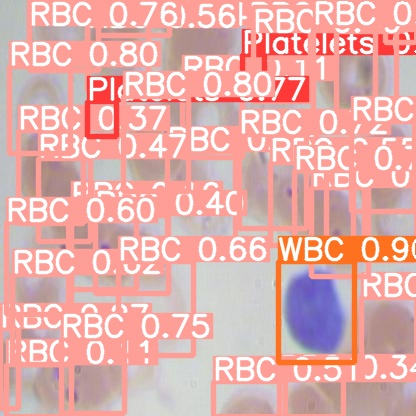

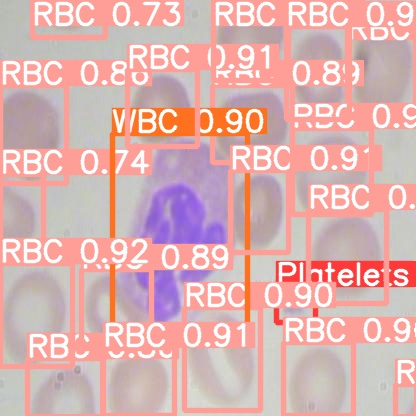

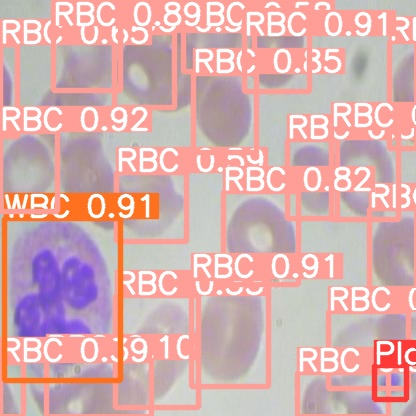

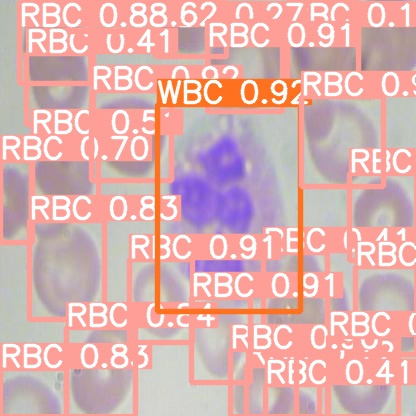

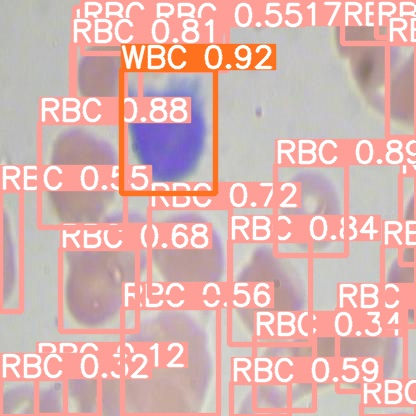

...

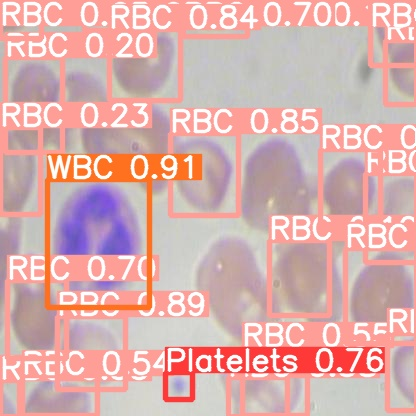

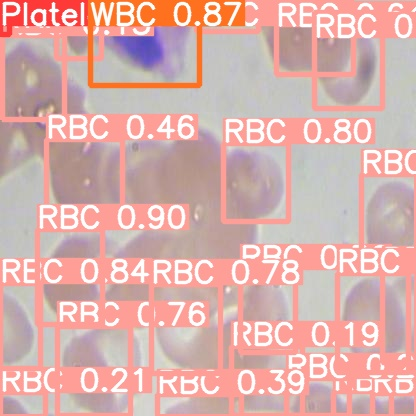

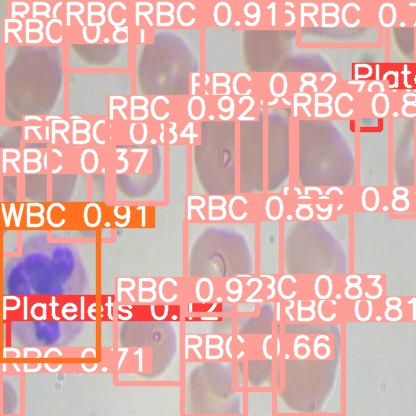

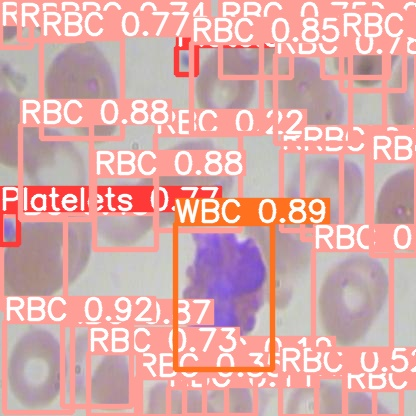

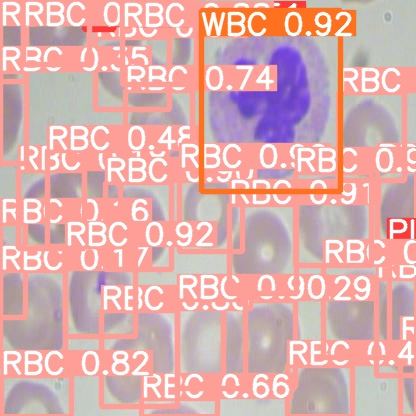

In [26]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [28]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp4/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
%cd yolov5/

/content/yolov5
